<a href="https://colab.research.google.com/github/himanshira/Deep-Learning/blob/main/Automating_Operations_Port_Deep_Neural_Network_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Statement
Marina Pier Inc. is leveraging technology to automate their operations on the San Francisco port.Marina Pier wants to use Deep Learning techniques to build an automatic reporting system that recognizes the boat. The company is also looking to use a transfer learning approach of any lightweight pre-trained model in order to deploy in mobile devices.

- Import Relevant Libraries

In [ ]:
# Basic Libraries

import skimage
import os
import pathlib
import tensorflow as tf
from tqdm import tqdm
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Tensorflow libraries

import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D, GlobalAvgPool2D, GlobalMaxPooling3D
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tensorflow import keras
from tensorflow.keras import layers
from PIL import Image
import PIL
from tensorflow.keras.models import Sequential

# Sklearn Libraries

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


In [ ]:
!unzip /content/boat_type_classification_dataset.zip

Archive:  /content/boat_type_classification_dataset.zip
   creating: boat_type_classification_dataset/
   creating: boat_type_classification_dataset/buoy/
  inflating: boat_type_classification_dataset/buoy/1.jpg  
  inflating: boat_type_classification_dataset/buoy/10.jpg  
  inflating: boat_type_classification_dataset/buoy/11.jpg  
  inflating: boat_type_classification_dataset/buoy/12.jpg  
  inflating: boat_type_classification_dataset/buoy/13.jpg  
  inflating: boat_type_classification_dataset/buoy/14.jpg  
  inflating: boat_type_classification_dataset/buoy/15.jpg  
  inflating: boat_type_classification_dataset/buoy/16.jpg  
  inflating: boat_type_classification_dataset/buoy/17.jpg  
  inflating: boat_type_classification_dataset/buoy/18.jpg  
  inflating: boat_type_classification_dataset/buoy/19.jpg  
  inflating: boat_type_classification_dataset/buoy/2.jpg  
  inflating: boat_type_classification_dataset/buoy/20.jpg  
  inflating: boat_type_classification_dataset/buoy/21.jpg  
  infla

# Task A: Build a CNN network to classify the boat

In [ ]:
# List the length of the contents present in the directory
data_dir = pathlib.Path("/content/boat_type_classification_dataset")

print("\nThe content of the directory are:\n")
for item in os.listdir(data_dir):
  print(item)


The content of the directory are:

sailboat
paper_boat
cruise_ship
inflatable_boat
buoy
freight_boat
ferry_boat
gondola
kayak


Total images in the dataset are 1162


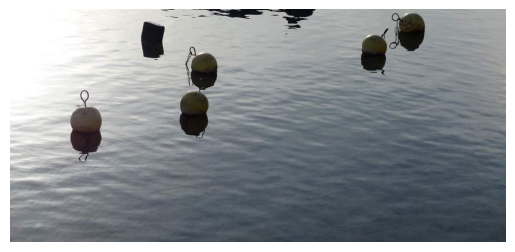

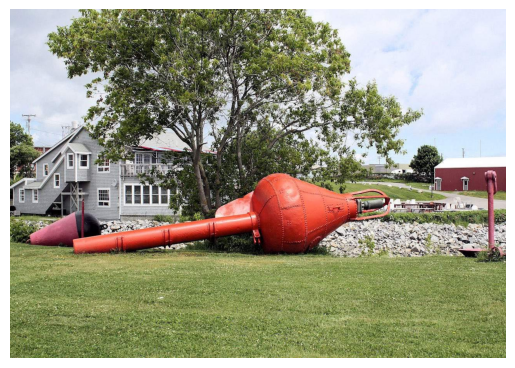

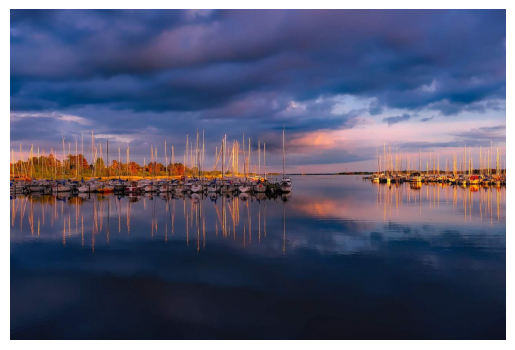

In [ ]:
# Count the total number of images

image_count = len(list(data_dir.glob('*/*.jpg')))
print(f"Total images in the dataset are {image_count}")

# Retrieve file paths

buoy = list(data_dir.glob('buoy/*'))
sailboat = list(data_dir.glob('sailboat/*'))

# Define a function to display images

def display_images(image_path):
  img = Image.open(str(image_path))
  plt.imshow(img)
  plt.axis('Off')
  plt.show()

# Display the first two buoy images and first sailboat image

if len(buoy) > 1:
  display_images(buoy[0])
  display_images(buoy[1])

if len(sailboat) > 0:
  display_images(sailboat[1])

## 1.1.	Split the dataset into train and test in the ratio 80:20, with shuffle and random state=43

In [ ]:
# Set parameters for dataset
batch_size = 32
img_height = 180
img_width = 180

# create training dataset using image rescaling using batch normalization

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=43,
    image_size=(img_height, img_width),
    batch_size=batch_size,

)

Found 1162 files belonging to 9 classes.
Using 930 files for training.


In [ ]:
# create validation dataset

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=43,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 1162 files belonging to 9 classes.
Using 232 files for validation.


In [ ]:
# Print class names

class_names = train_ds.class_names
print(f"The class names are: {class_names}.")

The class names are: ['buoy', 'cruise_ship', 'ferry_boat', 'freight_boat', 'gondola', 'inflatable_boat', 'kayak', 'paper_boat', 'sailboat'].


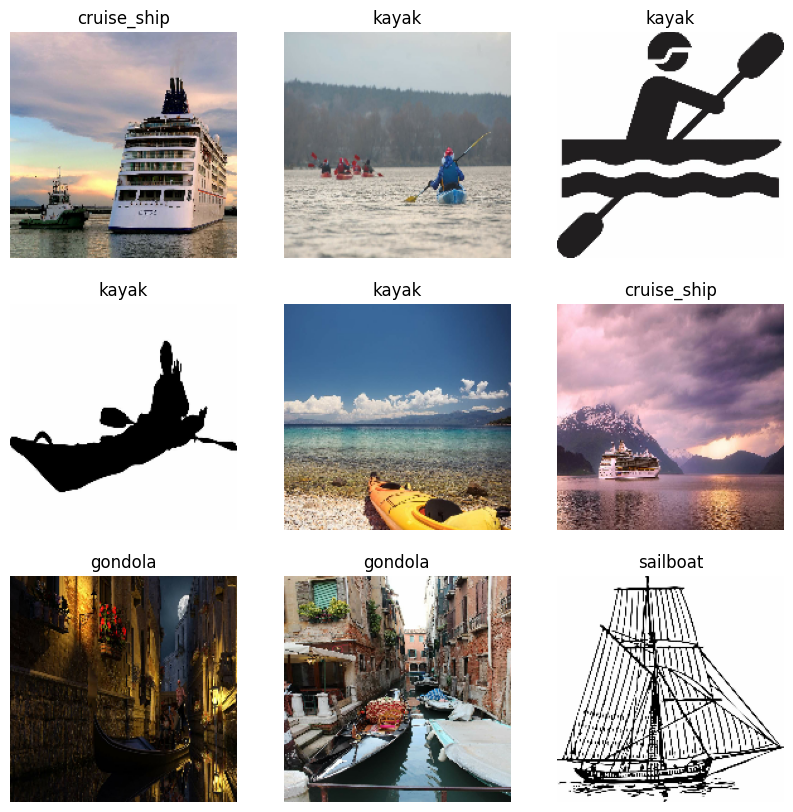

In [ ]:
# Visualize a subset of images from the training dataset

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
plt.show()

In [ ]:
# Create a logdir and integrate Tensorboard

from datetime import datetime
log_dir = "logs/fit" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

## 1.2.	Use tf.keras.preprocessing.image_dataset_from_directory to load the train and test datasets. This function also supports data normalization.

In [ ]:
# Preprocess and normalize the training dataset

AUTOTUNE = tf.data.AUTOTUNE

# Define a function to apply normalization and one-hot encoding

def preprocess_image_and_label(image, label):
    normalization_layer = layers.Rescaling(1./255)
    image = normalization_layer(image)
    try:
      num_classes_check = len(train_ds.class_names)
    except:
      max_label_value = -1
      for _, labels_check in train_ds.take(10):
            current_max = tf.reduce_max(labels_check).numpy()
            if current_max > max_label_value:
                max_label_value = current_max
      num_classes_check = max_label_value + 1

    label = tf.one_hot(label, depth=num_classes_check)
    return image, label

# Ensure num_classes is defined here as well for the mapping function below
try:
  num_classes = len(train_ds.class_names)
except:
  max_label_value = -1
  for _, labels in train_ds.take(10):
        current_max = tf.reduce_max(labels).numpy()
        if current_max > max_label_value:
            max_label_value = current_max
  num_classes = max_label_value + 1

# maps and applies the preprocessed data to each image and label pair creating a new dataset
# caches the dataset elements in memory or local storage after the first epoch to speed up the training

train_ds_nm = train_ds.map(preprocess_image_and_label).cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)

# shuffle() is typically omitted for validation data as order doesn't matter for evaluation

val_ds_nm = val_ds.map(preprocess_image_and_label).cache().prefetch(buffer_size=AUTOTUNE)

image_batch, labels_batch = next(iter(train_ds_nm)) # Use the new dataset variable name
first_image = image_batch[0]

print("\nMinimum value is set to 0 and maximum value is set to 1")
print(np.min(first_image), np.max(first_image))


Minimum value is set to 0 and maximum value is set to 1
0.0 0.9939884


## 1.3.	Load train, validation and test dataset in batches of 32 using the function initialized in the above step

In [ ]:
try:
  num_classes_detected = len(train_ds.class_names)
  print(f"Number of classes detected by Tensorflow: {num_classes_detected}")
  print(f"Detected class names: {train_ds.class_names}")
except:
  print("`train_ds.class_names` not available directly. Inferring from labels...")
  max_label_value = -1
  for _, labels in train_ds.take(10): # Use the original dataset to infer classes
        current_max = tf.reduce_max(labels).numpy()
        if current_max > max_label_value:
            max_label_value = current_max
  num_classes_detected = max_label_value + 1
  print(f"Inferred number of classes from labels: {num_classes_detected}")

# Define num_classes based on the detection
num_classes = num_classes_detected

Number of classes detected by Tensorflow: 9
Detected class names: ['buoy', 'cruise_ship', 'ferry_boat', 'freight_boat', 'gondola', 'inflatable_boat', 'kayak', 'paper_boat', 'sailboat']


## 1.4.	Build a CNN network using Keras with the following layers

In [ ]:
# num_classes is already defined in the previous cell

print(f"Building model with {num_classes} output classes.")

model = Sequential([
    layers.Conv2D(32, 3, activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

Building model with 9 output classes.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 87, 87, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 43, 43, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 32)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         4,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,041 (125.16 KB)

 Trainable params: 32,041 (125.16 KB)

 Non-trainable params: 0 (0.00 B)

## 1.5.	Compile the model with Adam optimizer, categorical_crossentropy loss, and with metrics accuracy, precision, and recall.

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy', # Changed to categorical_crossentropy
              metrics=['accuracy', 'precision', 'recall'])


In [ ]:
# Check GPU availablity

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


##1.6.	Train the model for 20 epochs and plot training loss and accuracy against epochs

In [ ]:
# Train the model with 20 Epochs

epochs = 20

# Add this section to inspect shapes

print("Inspecting shapes:")
for images, labels in train_ds_nm.take(1):
    print("Shape of images batch:", images.shape)
    print("Shape of labels batch:", labels.shape)
    predictions = model(images) # Perform a forward pass
    print("Shape of model predictions batch:", predictions.shape)
    break # Only need to inspect one batch

history = model.fit(
    train_ds_nm,
    validation_data=val_ds_nm,
    epochs=epochs,
    callbacks=[tensorboard_callback]
)

Inspecting shapes:
Shape of images batch: (32, 180, 180, 3)
Shape of labels batch: (32, 9)
Shape of model predictions batch: (32, 9)
Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - accuracy: 0.3339 - loss: 2.1680 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.3017 - val_loss: 2.1243 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3388 - loss: 2.0865 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.3017 - val_loss: 2.0234 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3305 - loss: 1.9766 - precision: 0.0645 - recall: 6.9372e-05 - val_accuracy: 0.3017 - val_loss: 1.9217 - val_precision: 1.0000 - val_recall: 0.0129
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3409 - loss: 1.8819 - precision: 0.7203 - recall: 0.0315 - val_accuracy: 0.3017 - val_loss: 1.8740 - val_precision: 0.8333 - val_recall: 

## View Tensorboard Metrics for the training

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## 1.7.	Evaluate the model on test images and print the test loss and accuracy

In [ ]:
test_loss, test_accuracy, test_precision, test_recall = model.evaluate(val_ds_nm)
print(f"Accuracy of the model on test images {test_accuracy * 100:.2f}%")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3485 - loss: 1.7531 - precision: 0.8758 - recall: 0.0451
Accuracy of the model on test images 32.33%


In [ ]:
# Predict the model on test data

y_pred = model.predict(val_ds_nm)
y_pred_classes = np.argmax(y_pred, axis=1) # This converts the probabilities to the predicted class index

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step


In [ ]:
all_true_labels_batches = []
for image_batch, label_batch in val_ds_nm:
  all_true_labels_batches.append(label_batch.numpy())

# Concatenate all collected batches of one-hot encoded true labels
all_true_labels = np.concatenate(all_true_labels_batches, axis=0)

# Convert one-hot encoded true labels back to integer labels
true_labels = np.argmax(all_true_labels, axis=1)

print(f"Number of true labels collected: {len(true_labels)}")
print(f"Number of predicted labels: {len(y_pred_classes)}")

Number of true labels collected: 232
Number of predicted labels: 232


## 1.8.	Plot heatmap of the confusion matrix and print classification report

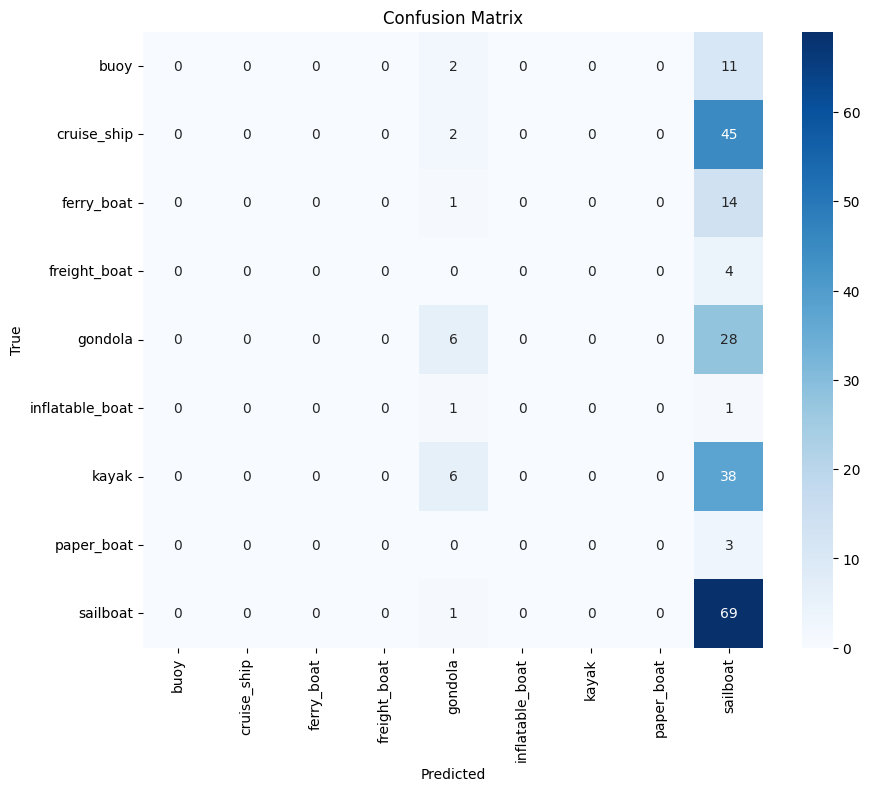

In [ ]:
if len(true_labels) != len(y_pred_classes):
  print("WARNING: Inconsistent sample counts between true_labels and y_pred_classes!")
  print("Please ensure your dataset iteration and prediction process cover the same number of samples.")
else:
  conf_matrix = confusion_matrix(true_labels, y_pred_classes)

  # Plot the Heatmap

  plt.figure(figsize=(10, 8))
  sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title('Confusion Matrix')
  plt.show()

In [ ]:
# Print classification report

print(classification_report(true_labels, y_pred_classes, target_names=class_names))

                 precision    recall  f1-score   support

           buoy       0.00      0.00      0.00        13
    cruise_ship       0.00      0.00      0.00        47
     ferry_boat       0.00      0.00      0.00        15
   freight_boat       0.00      0.00      0.00         4
        gondola       0.32      0.18      0.23        34
inflatable_boat       0.00      0.00      0.00         2
          kayak       0.00      0.00      0.00        44
     paper_boat       0.00      0.00      0.00         3
       sailboat       0.32      0.99      0.49        70

       accuracy                           0.32       232
      macro avg       0.07      0.13      0.08       232
   weighted avg       0.14      0.32      0.18       232



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## 2.	Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning.

- Import Libraries

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten
from keras.models import Model
from tensorflow.keras.utils import load_img
from keras.applications.mobilenet_v2 import preprocess_input

## 2.1.	Split the dataset into train and test datasets in the ration 70:30, with shuffle and random state=1

In [ ]:

random_state=1

training_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.3,
    subset="training",
    shuffle=True,
    seed = random_state,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.3,
    subset="validation",
    seed = random_state,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

Found 1162 files belonging to 9 classes.
Using 814 files for training.
Found 1162 files belonging to 9 classes.
Using 348 files for validation.


In [ ]:
try:
  num_classes = len(training_ds.num_classes)
  print(f"Number of classes detected by Tensorflow: {num_classes}")
  print(f"Detected class names: {training_ds.class_names}")
except AttributeError:
  print("Class names not directly available from the dataset. Inferring from labels.")

  # iterate over a subset to find max label
  max_label_train = -1
  for _, labels in training_ds.take(10):
    current_max = tf.reduce_max(labels).numpy()
    if current_max > max_label_train:
      max_label_train = current_max
  num_classes = max_label_train + 1
  print(f"Inferred number of classes from labels: {num_classes}")

Class names not directly available from the dataset. Inferring from labels.
Inferred number of classes from labels: 9


## 2.2.	Use tf.keras.preprocessing.image_dataset_from_directory to load the train and test datasets. This function also supports data normalization.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

def process_for_transfer_learning(image, label):
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  label = tf.one_hot(label, depth=num_classes)
  return image, label

# Apply preprocessing and optimize datasets

training_ds_nm = training_ds.map(process_for_transfer_learning).cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds_nm = test_ds.map(process_for_transfer_learning).cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# Build MObilenetv2 model

base_model = MobileNetV2(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Freeze the base model's layers

base_model.trainable = False

<ipython-input-27-a3674e9654d2>:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Create a new model from base_model

model_mobilenet = Sequential([
    tf.keras.Input(shape=(img_height, img_width, 3)),
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.2),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),
    layers.Dense(num_classes, activation='softmax')
])

model_mobilenet.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 9)              │         2,313 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,656,073 (10.13 MB)

 Trainable params: 397,065 (1.51 MB)

 Non-trainable params: 2,259,008 (8.62 MB)

## 2.5.	Compile the model with Adam optimizer, categorical_crossentropy loss, and metrics accuracy, Precision, and Recall.

In [ ]:
model_mobilenet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics = ['accuracy', 'precision', 'recall'])

## 2.6.	Train the model for 50 epochs and Early stopping while monitoring validation loss

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

epochs = 50

# training will continue for 5 more epochs even if val_loss doesn't improve

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [ ]:
print("Inspecting the shape:\n")
for images, labels in training_ds_nm.take(1):
  print("Shape of images batch:", images.shape)
  print("Shape of labels batch:", labels.shape)
  predictions = model(images)
  print("Shape of model predictions batch:", predictions.shape)
  break

Inspecting the shape:

Shape of images batch: (32, 180, 180, 3)
Shape of labels batch: (32, 9)
Shape of model predictions batch: (32, 9)


In [ ]:
history = model_mobilenet.fit(training_ds_nm,
                    validation_data = test_ds_nm,
                    epochs=epochs,
                    callbacks=[tensorboard_callback, early_stopping]
                    )

Epoch 1/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 40s 984ms/step - accuracy: 0.4198 - loss: 1.8875 - precision: 0.5862 - recall: 0.3364 - val_accuracy: 0.8103 - val_loss: 0.7179 - val_precision: 0.8866 - val_recall: 0.7414
Epoch 2/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - accuracy: 0.8750 - loss: 0.4098 - precision: 0.9193 - recall: 0.8320 - val_accuracy: 0.8075 - val_loss: 0.7056 - val_precision: 0.8494 - val_recall: 0.7615
Epoch 3/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.9343 - loss: 0.2159 - precision: 0.9526 - recall: 0.9047 - val_accuracy: 0.8075 - val_loss: 0.6921 - val_precision: 0.8323 - val_recall: 0.7701
Epoch 4/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.9669 - loss: 0.1318 - precision: 0.9759 - recall: 0.9525 - val_accuracy: 0.8247 - val_loss: 0.6111 - val_precision: 0.8537 - val_recall: 0.8046
Epoch 5/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - accuracy: 0.9890 - loss: 0.0682 - precision: 0.9914 - recall: 0.9845 - val_accuracy: 0.8391 - val_loss: 0.59

## 2.7.	Evaluate the model on test images and print the test loss and accuracy

In [ ]:
test_mobilenet_loss, test_mobilenet_accuracy, test_mobilenet_precision, test_mobilenet_recall = model_mobilenet.evaluate(test_ds_nm)
print(f"Accuracy of the model on test images {test_mobilenet_accuracy * 100:.2f}%")

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8561 - loss: 0.5596 - precision: 0.8775 - recall: 0.8136
Accuracy of the model on test images 83.91%


## 2.8.	Plot Train loss Vs Validation loss and Train accuracy Vs Validation accuracy.

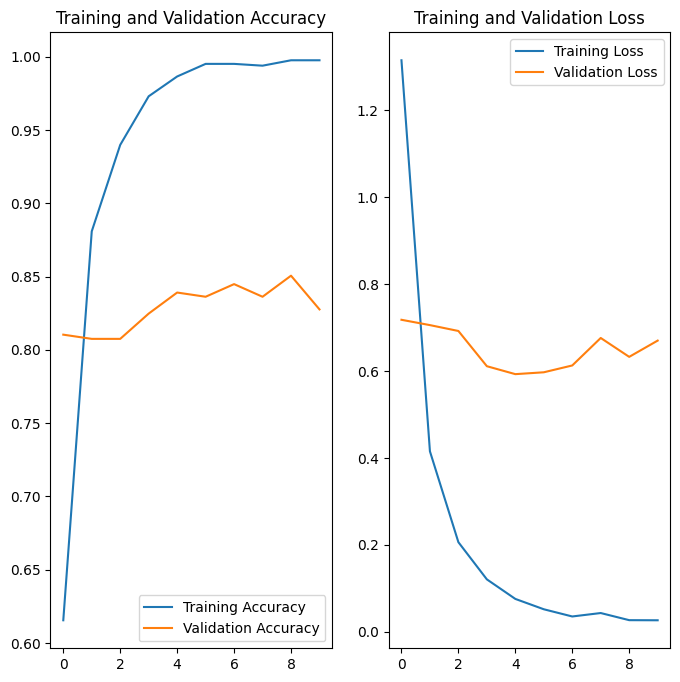

In [ ]:

acc_mobilenet = history.history['accuracy']
val_acc_mobilenet = history.history['val_accuracy']

loss_mobilenet = history.history['loss']
val_loss_mobilenet = history.history['val_loss']

epochs_range = range(10)

plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_mobilenet, label='Training Accuracy')
plt.plot(epochs_range, val_acc_mobilenet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_mobilenet, label='Training Loss')
plt.plot(epochs_range, val_loss_mobilenet, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

##3.	Compare the results of both models built in steps 1 and 2 and state your observations.

In [ ]:
test_loss_cnn, test_accuracy_cnn, test_precision_cnn, test_recall_cnn = model.evaluate(val_ds_nm)
test_loss_transfer, test_accuracy_transfer, test_precision_transfer, test_recall_transfer = model_mobilenet.evaluate(test_ds_nm)

print("\n--- Model Comparison Summary ---")
print(f"{'Metric':<25} | {'Model 1 (Original CNN)':<25} | {'Model 2 (MobileNetV2)':<25}")
print("-" * 80)
print(f"{'Test Accuracy':<25} | {test_accuracy_cnn * 100:.2f}%{'':<22} | {test_accuracy_transfer * 100:.2f}%{'':<22}")
print(f"{'Test Loss':<25} | {test_loss_cnn:.4f}{'':<21} | {test_loss_transfer:.4f}{'':<21}")
print(f"{'Test Precision':<25} | {test_precision_cnn:.4f}{'':<21} | {test_precision_transfer:.4f}{'':<21}")
print(f"{'Test Recall':<25} | {test_recall_cnn:.4f}{'':<21} | {test_recall_transfer:.4f}{'':<21}")
print("-" * 80)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3485 - loss: 1.7531 - precision: 0.8758 - recall: 0.0451
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8561 - loss: 0.5596 - precision: 0.8775 - recall: 0.8136

--- Model Comparison Summary ---
Metric                    | Model 1 (Original CNN)    | Model 2 (MobileNetV2)    
--------------------------------------------------------------------------------
Test Accuracy             | 32.33%                       | 83.91%                      
Test Loss                 | 1.7454                      | 0.5928                     
Test Precision            | 0.9000                      | 0.8620                     
Test Recall               | 0.0388                      | 0.8075                     
--------------------------------------------------------------------------------


##Conculsion

- The transfer learning model using MobileNetV2 performed better than the original CNN model therefore we will save this model and convert it to TensorflowLite so that it fits moile device

## Converting the model using TensorflowLite

In [ ]:
# save the model
save_model_dir = "final_model"
os.makedirs(save_model_dir, exist_ok=True)

model_mobilenet.save(os.path.join(save_model_dir, 'my_transfer_learning_model.keras'))

In [ ]:
# Convert the Keras model to a Tensorflow Lite model

converter = tf.lite.TFLiteConverter.from_keras_model(model_mobilenet)

tflite_model = converter.convert()

with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

Saved artifact at '/tmp/tmp0miy10mr'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name='keras_tensor_163')
Output Type:
  TensorSpec(shape=(None, 9), dtype=tf.float32, name=None)
Captures:
  132403768709712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403175176528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403802138064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403802137872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403768896080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403802136528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403836955792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403836955216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403847047184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132403802134800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1324038369

## Test the TFLITE Model

TFLite Model Input Details: [{'name': 'serving_default_keras_tensor_163:0', 'index': 0, 'shape': array([  1, 180, 180,   3], dtype=int32), 'shape_signature': array([ -1, 180, 180,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
TFLite Model Output Details: [{'name': 'StatefulPartitionedCall_1:0', 'index': 178, 'shape': array([1, 9], dtype=int32), 'shape_signature': array([-1,  9], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


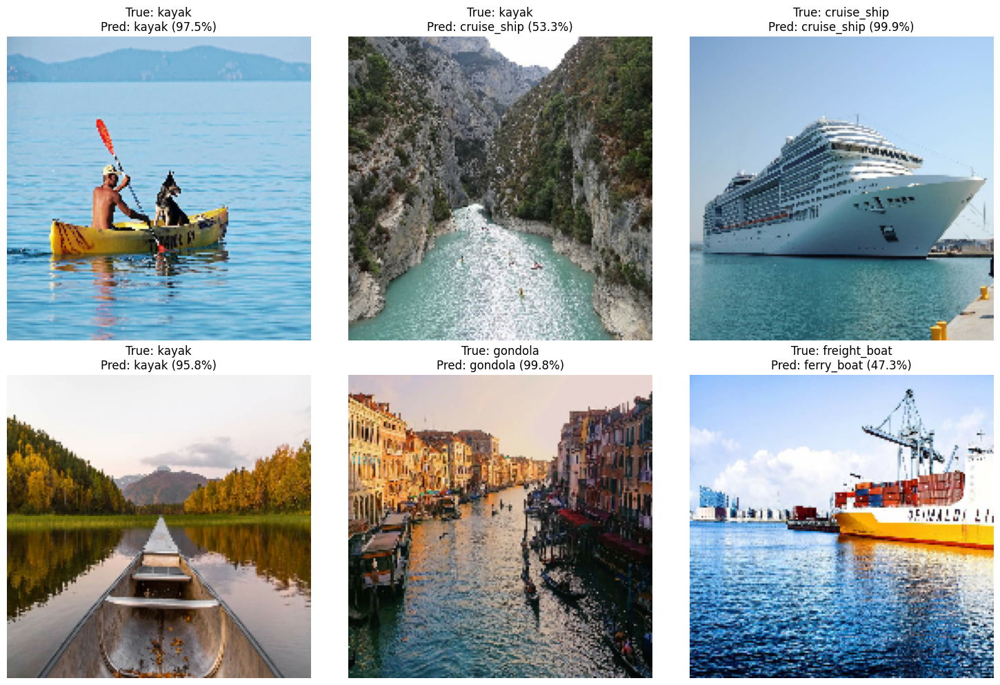

In [ ]:
# Load the TFLite model and allocate tensors

interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

# Get input and output details

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("TFLite Model Input Details:", input_details)
print("TFLite Model Output Details:", output_details)

# denormalize image for display

def denormalize_image(image_array):
  image_denorm = (image_array + 1) / 2
  return np.clip(image_denorm * 255, 0, 255).astype(np.uint8)

# Visualize a few predictions

num_images_to_show = 6
plt.figure(figsize=(15,10))

for images_batch, label_batches_one_hot in test_ds_nm.take(1):
  for i in range(min(num_images_to_show, images_batch.shape[0])):
    input_image = images_batch[i]
    # Perform TFLite inference for this single image
    interpreter.set_tensor(input_details[0]['index'], np.expand_dims(input_image, axis=0))
    interpreter.invoke()
    output_data = interpreter.get_tensor(output_details[0]['index'])

    #Get predicted class and confidence
    predicted_probabilities = output_data[0]
    predicted_class_idx = np.argmax(predicted_probabilities)
    predicted_confidence = np.max(predicted_probabilities)

    # Get true class
    true_class_idx = np.argmax(label_batches_one_hot[i].numpy())

    #Denormalize image for display
    display_image = denormalize_image(images_batch[i].numpy())

     # --- Plotting ---
    plt.subplot(2, num_images_to_show // 2 if num_images_to_show > 2 else 1, i + 1) # Adjust subplot grid dynamically
    plt.imshow(display_image)
    plt.title(f"True: {class_names[true_class_idx]}\nPred: {class_names[predicted_class_idx]} ({predicted_confidence*100:.1f}%)")
    plt.axis('off')

plt.tight_layout()
plt.show()